In [1]:
import math
import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib as mpl
import paste as pst
import scanpy as sc
import anndata
from sklearn.decomposition import NMF
import scanorama
import os
style.use('seaborn-dark')
mpl.rc('xtick', labelsize=14) 
mpl.rc('ytick', labelsize=14) 

##### WARNING: IF YOU ARE USING A VERSION OF PASTE THAT IS >v1.1.4 YOU MIGHT RUN INTO SOME SMALL ISSUES ############
########## ONE KNOWN ISSUE IS THAT THE INTERSECT FUNCTION IS NOT EXPORTED, an easy fix is to just do: 
#from paste.helper import intersect

<ipython-input-1-65330b838c2c>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  style.use('seaborn-dark')


In [2]:
path_to_output_dir = '../data/SCC/cached-results/'

#if not os.path.exists(path_to_output_dir):
#    os.makedirs(path_to_output_dir)

# Read in Data and Cache Adata

Saving it as .h5ad will make it faster to load the second time around.

In [3]:
def load_layer(patient, sample, metadata):
    """
    Return Layer object of Patient, Sample
    """
    layer_path = f"../data/SCC/scc_p{patient}_layer{sample}"
    layer = layer_path + ".tsv"
    coor_path = layer_path + "_coordinates.tsv"
    adata = anndata.read_csv(layer, delimiter="\t")

    # Data pre-processing
    coor = pd.read_csv(coor_path, sep="\t").iloc[:,:2]
    coor_index = []
    for pair in coor.values:
        coor_index.append('x'.join(str(e) for e in pair))
    coor.index = coor_index
    # The metadata, coordinates, and gene expression might have missing cells between them
    idx = pst.intersect(coor_index, adata.obs.index)
    
    df = metadata[metadata['patient'] == patient]
    df = df[df['sample'] == sample]
    
    meta_idx = []
    for i in df.index:
        meta_idx.append(i.split('_')[1])
    idx = pst.intersect(idx, meta_idx)
    
    adata = adata[idx, :]
    adata.obsm['spatial'] = np.array(coor.loc[idx, :])
    metadata_idx = ['P' + str(patient) + '_' + i + '_' + str(sample) for i in idx]
    adata.obs['original_clusters'] = [str(x) for x in list(metadata.loc[metadata_idx, 'SCT_snn_res.0.8'])]
    return adata

In [4]:
metadata_path =  "../data/SCC/ST_all_metadata.txt"
metadata = pd.read_csv(metadata_path, sep="\t", index_col=0)

adata_2_1 = load_layer(2, 1, metadata)
adata_2_2 = load_layer(2, 2, metadata)
adata_2_3 = load_layer(2, 3, metadata)
patient_2 = [adata_2_1, adata_2_2, adata_2_3]

adata_5_1 = load_layer(5, 1, metadata)
adata_5_2 = load_layer(5, 2, metadata)
adata_5_3 = load_layer(5, 3, metadata)
patient_5 = [adata_5_1, adata_5_2, adata_5_3]

adata_9_1 = load_layer(9, 1, metadata)
adata_9_2 = load_layer(9, 2, metadata)
adata_9_3 = load_layer(9, 3, metadata)
patient_9 = [adata_9_1, adata_9_2, adata_9_3]

adata_10_1 = load_layer(10, 1, metadata)
adata_10_2 = load_layer(10, 2, metadata)
adata_10_3 = load_layer(10, 3, metadata)
patient_10 = [adata_10_1, adata_10_2, adata_10_3]

patients = {
    "patient_2" : patient_2,
    "patient_5" : patient_5,
    "patient_9" : patient_9,
    "patient_10" : patient_10,
}

for p in patients.values():
    for adata in p:
        sc.pp.filter_genes(adata, min_cells = 15, inplace = True)
        sc.pp.filter_cells(adata, min_genes = 100, inplace = True)

In [5]:
H5ADs_dir = path_to_output_dir + 'H5ADs/'

if not os.path.exists(H5ADs_dir):
    os.makedirs(H5ADs_dir)
    
for k, p in patients.items():
    for i in range(len(p)):
        p[i].write(H5ADs_dir + k + '_slice_' + str(i) + '.h5ad')

... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical
... storing 'original_clusters' as categorical


# Pairwise Alignment Experiment

## Define Functions

Calculate percent of original clusters preserved between layers based on pairwise alignment.

In [6]:
def pairwise_exp(adata1, adata2):
    
    # Run pairwise align
    pi = pst.pairwise_align(adata1, adata2, alpha = 0.1)
    
    spotsA, spotsB = np.nonzero(pi)
    s = 0
    for i in range(len(spotsA)):
        # get the clusters corresponding to each spot
        a = adata1.obs['original_clusters'][spotsA[i]]
        b = adata2.obs['original_clusters'][spotsB[i]]
        if a == b:
            s += pi[spotsA[i]][spotsB[i]]
    return s

## Read in Data and Run Experiment

Uncomment the following cells to regenerate the experimental results.

In [7]:
# path_to_h5ads = path_to_output_dir + 'H5ADs/'

# patient_2 = []
# patient_5 = []
# patient_9 = []
# patient_10 = []

# patients = {
#     "patient_2" : patient_2,
#     "patient_5" : patient_5,
#     "patient_9" : patient_9,
#     "patient_10" : patient_10,
# }

# for k in patients.keys():
#     for i in range(3):
#         patients[k].append(sc.read_h5ad(path_to_h5ads + k + '_slice_' + str(i) + '.h5ad'))

In [8]:
# df = pd.DataFrame()
# for k, patient_n in patients.items():
#     a = pairwise_exp(patient_n[0].copy(), patient_n[1].copy())
#     b = pairwise_exp(patient_n[1].copy(), patient_n[2].copy())
#     df[k] = [a, b]

In [9]:
# df

In [10]:
# results_dir = path_to_output_dir + 'results/'

# if not os.path.exists(results_dir):
#     os.makedirs(results_dir)

In [11]:
# df.to_csv(results_dir + 'pairwise_results.csv')

## Plot Pairwise Results

In [12]:
results_dir = path_to_output_dir + 'results/'
df = pd.read_csv(results_dir + 'pairwise_results.csv', index_col = 0)

In [13]:
df

,patient_2,patient_5,patient_9,patient_10
0,0.719589,0.273168,0.242048,0.591831
1,0.684851,0.353965,0.251449,0.477576


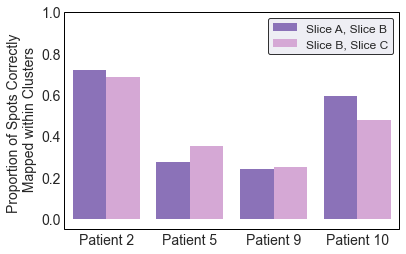

In [14]:
scores = df.melt()['value'].values
colors = ["#8766c4", "#dda0dd"]
bar_label = 4*['Slice A, Slice B', 'Slice B, Slice C']
labels = 2*['Patient 2'] + 2*['Patient 5'] + 2*['Patient 9'] +2*['Patient 10']
ax2 = sns.barplot(x=labels, y = scores, hue=bar_label, palette=sns.color_palette(colors))
ax2.set_facecolor('white')
ax2.patch.set_edgecolor('black')
ax2.patch.set_linewidth('1')  
ax2.set_ylabel("Proportion of Spots Correctly \n Mapped within Clusters", fontsize = 14)
ax2.set_ylim(-0.05,1)
plt.legend(frameon=True, edgecolor='black', fontsize = 12)

# Center Alignment Experiment

## Read in Data

In [15]:
path_to_h5ads = path_to_output_dir + 'H5ADs/'

patient_2 = []
patient_5 = []
patient_9 = []
patient_10 = []

patients = {
    "patient_2" : patient_2,
    "patient_5" : patient_5,
    "patient_9" : patient_9,
    "patient_10" : patient_10,
}

for k in patients.keys():
    for i in range(3):
        patients[k].append(sc.read_h5ad(path_to_h5ads + k + '_slice_' + str(i) + '.h5ad'))

## Plot clusters

We provide an alternative to scanpy .

In [16]:
def plot_clusters(adata, col, title = ''):
    """
    Plots spatial data with cluster labels stored in adata.obs[col]
    """
    x = adata.obsm['spatial'][:, 0]
    y = adata.obsm['spatial'][:, 1]
    label = adata.obs[col]
    n_colors = len(np.unique(label))
    palette = sns.color_palette("Paired", n_colors)
    plt.figure(figsize= (5, 5))
    ax = sns.scatterplot(x=x, y=y, hue=label, legend="full", palette = palette)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_facecolor('white')
    plt.axis('off')
    plt.title(title)
    plt.show()

Plot the original clusters from the authors paper.

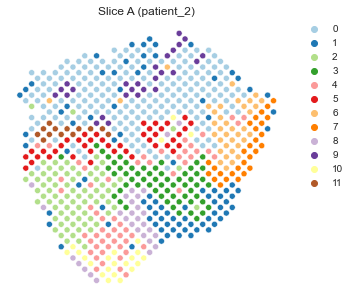

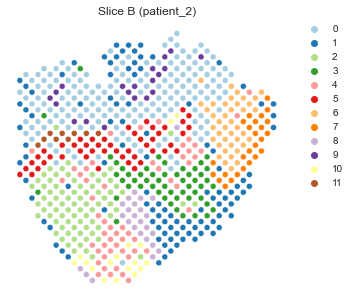

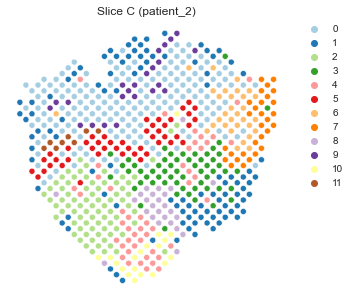

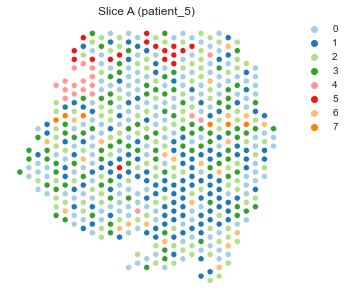

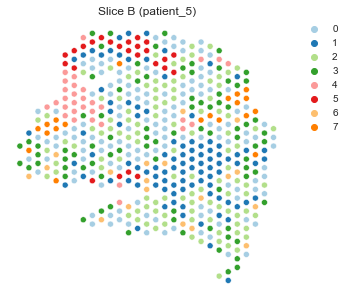

...

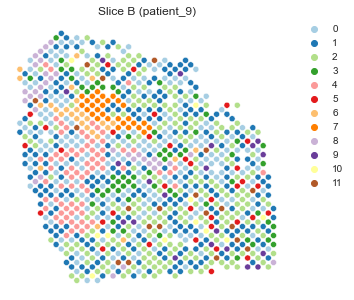

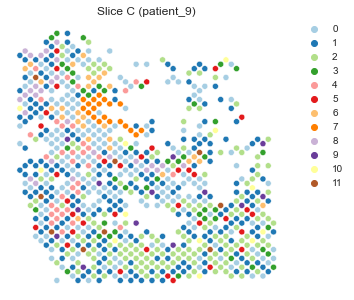

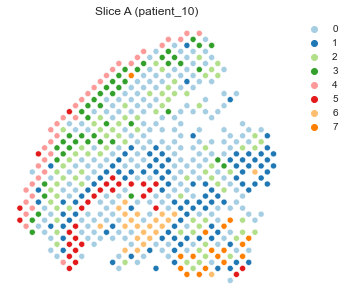

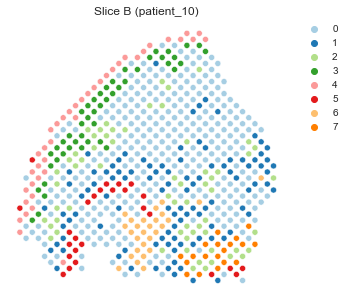

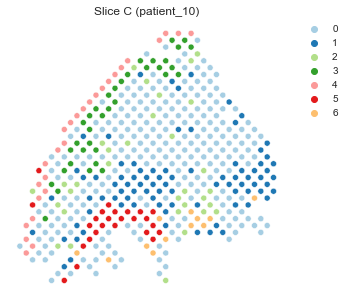

In [17]:
for k, patient_n in patients.items():
    for adata, s in zip(patient_n, ['Slice A', 'Slice B', 'Slice C']):
        plot_clusters(adata, 'original_clusters', title = s + ' (' + k + ')')

Infer center layer via center alignment. And cache it.

In [18]:
path_to_center_dir = path_to_output_dir + 'center_nmfs/'
if not os.path.exists(path_to_center_dir):
    os.makedirs(path_to_center_dir)

In [19]:
saved = []
for k, patient_n in patients.items():
    initial_slice = patient_n[0].copy()
    lmbda = len(patient_n)*[1/len(patient_n)]
    center_slice, pis = pst.center_align(initial_slice, patient_n, lmbda, random_seed = 5)
    center_slice.write(path_to_center_dir + k + '_center.h5ad')
    saved.append(center_slice)

Filtered all slices for common genes. There are 12242 common genes.
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9166369889154491
Difference: 0.9166369889154491

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  0.9055580018043896
Difference: 0.01107898711105948

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  0.9046146250043413
Difference: 0.0009433768000483012

Filtered all slices for common genes. There are 7831 common genes.
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  1.3795206050328448
Difference: 1.3795206050328448

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  1.334184183675891
Difference: 0.045336421356953815

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  1.334139950384968
Difference: 4.4233290922957025e-05

Filtered all slices for common genes. There are 8340 common genes.
Iteration: 0
Solving Pairwise S

Next, we run K-means cluster on the W matrix from NMF on center slice.

In [20]:
from sklearn.cluster import KMeans

def k_means(adata, n_clusters):
    a = adata.uns['paste_W'].copy()
    a = (a.T/a.sum(axis=1)).T
    a = a + 1
    a = np.log(a)
    
    # Number of clusters is chosen to be the same as in the original clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=5).fit(a)
    l = kmeans.labels_
    return l

In [21]:
path_to_center_dir = path_to_output_dir + 'center_nmfs/'

center_slices = {}

for k in ['patient_2', 'patient_5', 'patient_9', 'patient_10']:
    center_slice = sc.read_h5ad(path_to_center_dir + k + '_center.h5ad')
    center_slices[k] = center_slice

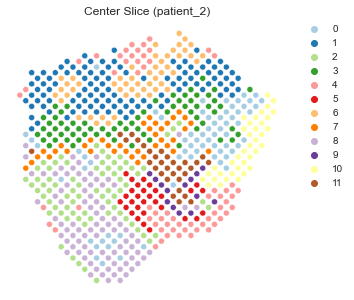

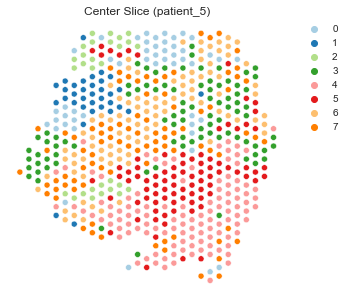

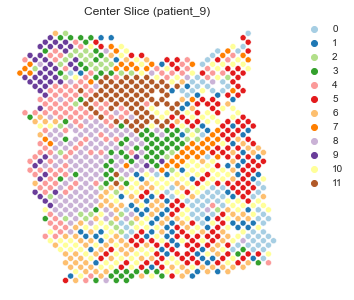

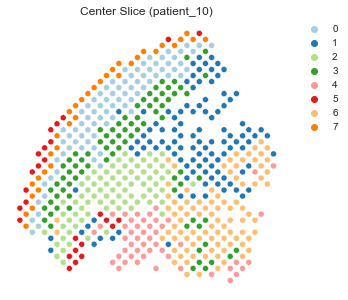

In [22]:
num_clusters = {
    'patient_2' : 12,
    'patient_5' : 8,
    'patient_9' : 12,
    'patient_10' : 8
}

for k, adata in center_slices.items():
    labels = k_means(adata, num_clusters[k])
    adata.obs['kmeans'] = labels
    plot_clusters(adata, 'kmeans', title = 'Center Slice (' + k + ')')

In [23]:
for k, adata in center_slices.items():
    adata.write(path_to_center_dir + k + '_center.h5ad')

## Calculate Spatial Coherence scores.

In [24]:
import networkx as nx
from scipy.spatial.distance import cdist

def create_graph(adata, degree = 4):
        """
        Converts spatial coordinates into graph using networkx library.
        
        param: adata - ST Slice 
        param: degree - number of edges per vertex

        return: 1) G - networkx graph
                2) node_dict - dictionary mapping nodes to spots
        """
        D = cdist(adata.obsm['spatial'], adata.obsm['spatial'])
        # Get column indexes of the degree+1 lowest values per row
        idx = np.argsort(D, 1)[:, 0:degree+1]
        # Remove first column since it results in self loops
        idx = idx[:, 1:]

        G = nx.Graph()
        for r in range(len(idx)):
            for c in idx[r]:
                G.add_edge(r, c)

        node_dict = dict(zip(range(adata.shape[0]), adata.obs.index))
        return G, node_dict
    
def generate_graph_from_labels(adata, labels_dict):
    """
    Creates and returns the graph and dictionary {node: cluster_label} for specified layer
    """
    
    g, node_to_spot = create_graph(adata)
    spot_to_cluster = labels_dict

    # remove any nodes that are not mapped to a cluster
    removed_nodes = []
    for node in node_to_spot.keys():
        if (node_to_spot[node] not in spot_to_cluster.keys()):
            removed_nodes.append(node)

    for node in removed_nodes:
        del node_to_spot[node]
        g.remove_node(node)
        
    labels = dict(zip(g.nodes(), [spot_to_cluster[node_to_spot[node]] for node in g.nodes()]))
    return g, labels

def spatial_coherence_score(graph, labels):
    g, l = graph, labels
    true_entropy = spatial_entropy(g, l)
    entropies = []
    for i in range(1000):
        new_l = list(l.values())
        random.shuffle(new_l)
        labels = dict(zip(l.keys(), new_l))
        entropies.append(spatial_entropy(g, labels))
        
    return (true_entropy - np.mean(entropies))/np.std(entropies)

def spatial_entropy(g, labels):
    """
    Calculates spatial entropy of graph  
    """
    # construct contiguity matrix C which counts pairs of cluster edges
    cluster_names = np.unique(list(labels.values()))
    C = pd.DataFrame(0,index=cluster_names, columns=cluster_names)

    for e in g.edges():
        C[labels[e[0]]][labels[e[1]]] += 1

    # calculate entropy from C
    C_sum = C.values.sum()
    H = 0
    for i in range(len(cluster_names)):
        for j in range(i, len(cluster_names)):
            if (i == j):
                z = C[cluster_names[i]][cluster_names[j]]
            else:
                z = C[cluster_names[i]][cluster_names[j]] + C[cluster_names[j]][cluster_names[i]]
            if z != 0:
                H += -(z/C_sum)*math.log(z/C_sum)
    return H

Read in original data again if you need to.

In [25]:
path_to_h5ads = path_to_output_dir + 'H5ADs/'

patient_2 = []
patient_5 = []
patient_9 = []
patient_10 = []

patients = {
    "patient_2" : patient_2,
    "patient_5" : patient_5,
    "patient_9" : patient_9,
    "patient_10" : patient_10,
}

for k in patients.keys():
    for i in range(3):
        patients[k].append(sc.read_h5ad(path_to_h5ads + k + '_slice_' + str(i) + '.h5ad'))

In [26]:
path_to_center_dir = path_to_output_dir + 'center_nmfs/'

center_slices = {}

for k in ['patient_2', 'patient_5', 'patient_9', 'patient_10']:
    center_slice = sc.read_h5ad(path_to_center_dir + k + '_center.h5ad')
    center_slices[k] = center_slice

Calculate spatial coherence of original clusters. Uncomment out the cells below to regenerate these files. 

In [27]:
# df = pd.DataFrame()
# for k, adata_list in patients.items():
#     print(k)
#     scores = []
#     for adata in adata_list:
#         g, l = generate_graph_from_labels(adata, adata.obs['original_clusters'])
#         scores.append(np.abs(spatial_coherence_score(g, l)))
#         print('Slice Done')
#     g, l = generate_graph_from_labels(center_slices[k], center_slices[k].obs['kmeans'])
#     scores.append(np.abs(spatial_coherence_score(g, l)))
#     print('Slice Done')
#     df[k] = scores
# df.index = ['Slice A', 'Slice B', 'Slice C', 'Center']

In [28]:
# df

In [29]:
#results_dir = path_to_output_dir + 'results/'

#if not os.path.exists(results_dir):
#    os.makedirs(results_dir)

In [30]:
#df.to_csv(results_dir + 'spatial_coherence.csv')

# Note that for our plots we take the absolute value.

## Plot Spatial Coherence

In [31]:
results_dir = path_to_output_dir + 'results/'
df = pd.read_csv(results_dir + 'spatial_coherence.csv', index_col= 0)
df = df.loc[['Center', 'Slice A', 'Slice B', 'Slice C']]
df

,patient_2,patient_5,patient_9,patient_10
Center,103.089369,28.790719,71.637723,55.194953
Slice A,56.549024,3.216828,11.763942,11.565289
Slice B,54.935245,6.930772,14.155044,16.318604
Slice C,51.404252,6.552960,4.471351,3.737632


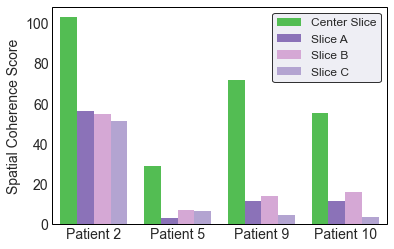

In [32]:
colors = ["#41cf41", "#8766c4", "#dda0dd", "#b19cd9"]
bar_label = 4*['Center Slice','Slice A', 'Slice B', 'Slice C', ]
labels = 4*['Patient 2'] + 4*['Patient 5'] + 4*['Patient 9'] +4*['Patient 10']
zscores = []
for c in df.columns:
    zscores.append(df[c])
zscores = np.concatenate(zscores)
ax2 = sns.barplot(x=labels, y = zscores, hue=bar_label, palette=sns.color_palette(colors))
ax2.set(ylabel="|Spatial Entropy Z-Score|")
ax2.set_facecolor('white')
ax2.patch.set_edgecolor('black')
ax2.patch.set_linewidth('1')  
ax2.set_ylabel("Spatial Coherence Score", fontsize = 14)
plt.legend(frameon=True, edgecolor='black', fontsize = 12)

## Getting spatial coherence score from spatial entropy

For a given set of cluster labels, spatial coherence score is calculated by taking the std deviation from the distribution of spatial entropies generated from randomly permuting the cluster labels between spots.

In [33]:
def get_entropy_distribution(adata, cluster_col):
    g, l = generate_graph_from_labels(adata, adata.obs[cluster_col])
    true_entropy = spatial_entropy(g, l)
    entropies = []
    for i in range(1000):
        new_l = list(l.values())
        random.shuffle(new_l)
        labels = dict(zip(l.keys(), new_l))
        entropies.append(spatial_entropy(g, labels))
    return entropies, true_entropy

In [34]:
H5ADs_dir = path_to_output_dir + 'H5ADs/'
p2_sliceA = sc.read_h5ad(H5ADs_dir + 'patient_2_slice_0.h5ad')
p9_sliceA = sc.read_h5ad(H5ADs_dir + 'patient_9_slice_0.h5ad')

In [35]:
p2_entropies, p2_true_entropy = get_entropy_distribution(p2_sliceA, 'original_clusters')
p9_entropies, p9_true_entropy = get_entropy_distribution(p9_sliceA, 'original_clusters')

/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


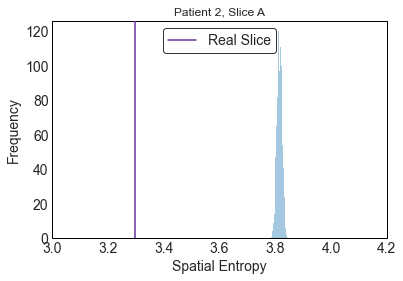

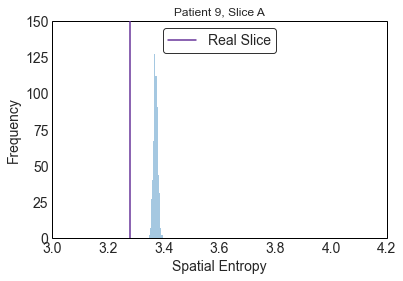

In [36]:
plt.figure(1)
ax = sns.distplot(p2_entropies, bins=20, kde=False)
ax.set(xlim=(3, 4.2))
ax.set_xlabel('Spatial Entropy', fontsize=14)
ax.set_ylabel("Frequency", fontsize=14)
ax.set_facecolor('white')
ax.patch.set_edgecolor('black')
ax.patch.set_linewidth('1')  
ax.set_title('Patient 2, Slice A')
plt.axvline(x=p2_true_entropy, label='Real Slice', color = "#663399" )
plt.legend(loc='upper center', fontsize = 14, frameon=True, edgecolor='black', facecolor='white')
plt.tick_params(labelsize=14)
plt.show()

plt.figure(1)
ax = sns.distplot(p9_entropies, bins=20, kde=False)
ax.set(xlim=(3, 4.2))
ax.set_xlabel('Spatial Entropy', fontsize=14)
ax.set_ylabel("Frequency", fontsize=14)
ax.set_facecolor('white')
ax.patch.set_edgecolor('black')
ax.patch.set_linewidth('1')  
ax.set_title('Patient 9, Slice A')
plt.axvline(x=p9_true_entropy, label='Real Slice', color = "#663399" )
plt.legend(loc='upper center', fontsize = 14, frameon=True, edgecolor='black', facecolor='white')
plt.tick_params(labelsize=14)
plt.show()

# Accuracy vs Spatial Coherence Plot

For each pair of consecutive slices, we plot the % preserved (pairwise experiment) vs the average spatial coherence score of the two slices (center experiment).

In [37]:
# To avoid clutter, we run the analysis for other patients separately and read in the results
results_dir = path_to_output_dir + 'results/'
spatial_coherence_df = pd.read_csv(results_dir + 'spatial_coherence.csv', index_col= 0)
pairwise_df = pd.read_csv(results_dir + 'pairwise_results.csv', index_col = 0)

In [38]:
spatial_coherence_df

,patient_2,patient_5,patient_9,patient_10
Slice A,56.549024,3.216828,11.763942,11.565289
Slice B,54.935245,6.930772,14.155044,16.318604
Slice C,51.404252,6.552960,4.471351,3.737632
Center,103.089369,28.790719,71.637723,55.194953


In [39]:
pairwise_df

,patient_2,patient_5,patient_9,patient_10
0,0.719589,0.273168,0.242048,0.591831
1,0.684851,0.353965,0.251449,0.477576


For each pair of consecutive slices, we plot the proportion of clusters preserved vs the average spatial coherence of the two slices.

In [40]:
p = np.concatenate([pairwise_df[c] for c in pairwise_df.columns])
p

array([0.71958936, 0.68485091, 0.27316778, 0.35396518, 0.24204831,
       0.25144928, 0.59183056, 0.47757603])

In [41]:
z = []
for c in spatial_coherence_df.columns:
    z.append(np.mean([spatial_coherence_df[c]['Slice A'], spatial_coherence_df[c]['Slice B']]))
    z.append(np.mean([spatial_coherence_df[c]['Slice B'], spatial_coherence_df[c]['Slice C']]))
z

[55.742134500000006,
 53.1697485,
 5.0738,
 6.741866,
 12.959493,
 9.313197500000001,
 13.9419465,
 10.028118000000001]

/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 7 Text major ticklabel objects>)

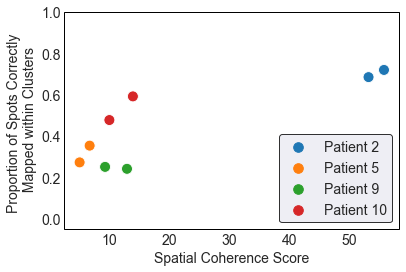

In [42]:
labels = 2*["Patient 2"] + 2*["Patient 5"] + 2*["Patient 9"] + 2*["Patient 10"]
palette = sns.color_palette(n_colors= 4)

ax = sns.scatterplot(np.abs(z), p, hue = labels, palette=palette, s = 120)
plt.legend(loc='lower right', frameon=True, edgecolor='black', fontsize= 14, markerscale = 1.6)
ax.set_facecolor('white')
ax.patch.set_edgecolor('black')
ax.patch.set_linewidth('1')  
ax.set_xlabel("Spatial Coherence Score", fontsize = 14)
ax.set_ylabel("Proportion of Spots Correctly \n Mapped within Clusters", fontsize = 14)
ax.set_ylim(-0.05, 1)
plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)

# Plot 3d

Read in data

In [43]:
path_to_h5ads = path_to_output_dir + 'H5ADs/'

patient_2 = []
patient_5 = []
patient_9 = []
patient_10 = []

patients = {
    "patient_2" : patient_2,
    "patient_5" : patient_5,
    "patient_9" : patient_9,
    "patient_10" : patient_10,
}

for k in patients.keys():
    for i in range(3):
        patients[k].append(sc.read_h5ad(path_to_h5ads + k + '_slice_' + str(i) + '.h5ad'))

Run pairwise align and calculate alignment based on pis

In [44]:
import plotly.express as px
import plotly.io as pio
import warnings

In [45]:
for k, patient_n in patients.items():
    pi12 = pst.pairwise_align(patient_n[0].copy(), patient_n[1].copy(), alpha = 0.1)
    pi23 = pst.pairwise_align(patient_n[1].copy(), patient_n[2].copy(), alpha = 0.1)
    pis = [pi12, pi23]
    new_slices = pst.stack_slices_pairwise(patient_n, pis)
    
    # Plot 3d
    warnings.filterwarnings("ignore")
    ## comment out the following line and uncomment out the line below the next if you use jupyterlab instead jupyter notebooks.
    pio.renderers.default='notebook'
    #pio.renderers.default='jupyterlab' 
    slice_colors = ['#e41a1c','#377eb8','#4daf4a','#984ea3']
    # scale the distance between layers
    z_scale = 5

    df = pd.DataFrame(columns=['x','y','z','layer'])

    clusters = []
    for i,L in enumerate(new_slices):
        for x,y in L.obsm['spatial']:
            df = df.append({'x': x,'y':y,'z':i*z_scale,'slice':str(i)}, ignore_index=True)

        clusters.append(np.array(L.obs['original_clusters']))
    clusters = np.concatenate(clusters)
    df['clusters'] = clusters
    fig = px.scatter_3d(df, x='x', y='y', z='z',color='clusters', title = k)
    fig.update_layout(scene_aspectmode='data')
    fig.show()